<a href="https://colab.research.google.com/github/MarinaSupiot/faostat-correct/blob/main/analyse_explotoire.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import gc
from hyperopt import hp
from hyperopt import tpe
from hyperopt import fmin
from hyperopt import space_eval, STATUS_OK
import plotly.express as px
from plotly.offline import iplot

from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

import lightgbm as lgb
!pip install lime
from lime import lime_tabular

import matplotlib as mpl
%matplotlib inline
import matplotlib.pyplot as plt
import missingno as msno
import numpy as np
import pandas as pd
import pickle
import random
import re
import seaborn as sns
!pip install shap
import shap


import sklearn
from sklearn.dummy import DummyClassifier
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler


from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder

from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix

from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split

import time

# Versions
print('Version des librairies utilisées :')


print('Matplotlib            : ' + mpl.__version__)
print('Missingno             : ' + msno.__version__)
print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Seaborn               : ' + sns.__version__)
print('Shap                  : ' + shap.__version__)
print('Sklearn               : ' + sklearn.__version__ )

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=826c3433a946580d0e75add3378448baa5a4e0f474413bf44b287bfdb499d823
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.9/532.9 kB 11.1 MB/s eta 0:00:00
Version des librairies utilisées :
Matplotlib            : 3.7.1
Missingno             : 0.5.2
NumPy                 : 1.23.5
Pandas                : 1.5.3
Seaborn               : 0.12.2
Shap                  : 0.43.0
Sklearn               : 1.2.2


# Fonctions

In [3]:
pd.set_option('display.max_columns', 300)
pd.set_option('display.max_row', 500)
pd.set_option('display.max_colwidth', 200)

In [4]:
def timeit(f):
    '''
    fonction décoratrice qui donne le temps d'éxecution d'une autre fonction
    '''
    def timed(*args, **kw):

        ts = time.time()
        result = f(*args, **kw)
        te = time.time()

        print (f"Durée d'exécution de {f.__name__}: {te-ts}s")
        return result

    return timed

In [5]:
@timeit
def missing_values(df):
        '''
        Fonction qui calcule les valeurs manquantes d'un dataset

        '''
        # Nombre total de valeurs manquantes
        mis_val = df.isna().sum()

        # Pourcentage de valeurs manquantes
        mis_val_percent =(df.isnull().sum() / len(df))*100

        # Construction d'un tableau avec les résultats
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)

        # Renommage des colonnes
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Valeurs manquantes', 1 : '% total des valeurs'})

        # On range de manière décroissante
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% total des valeurs', ascending=False).round(1)


        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [6]:
@timeit
def description_dataset(data, name):
    '''
    Return the description of a dataset

        Parameters:
            data: dataframe
            name:

        Returns:
            the 3 first line of the dataframe
            the shape, the types, the number of null values,
            the number of unique values, the number of duplicated values

    '''
    print("On traite le dataset ", name)
    msno.bar(data)

    display(data.head(3))
    print(f'Taille :-------------------------------------------------------------- {data.shape}')

    print("--"*50)
    print("Valeurs manquantes par colonnes (%): ")
    table = missing_values(data)
    display(table.head(50))

    print("--"*50)
    print("Valeurs différentes par variables : ")
    for col in data:
        if data[col].nunique() < 30:
            print (f'{col :-<70} {data[col].unique()}')
        else :
            print(f'{col :-<70} contient {data[col].nunique()} valeurs différentes')
    print("--"*50)
    print(f"Nombre de doublons : {data.duplicated().sum()}")

In [7]:
def cleaning_categories(col):
    '''
    Fonction qui nettoie une phrase de ses caractères spéciaux.
    Et la passe en majuscule( pour un passage en nom de colonne avec one hot)
    '''
    col = str(col).replace('-', '').replace('+', '').replace('/', ' ').replace(':', '_')
    col = str(col).upper()
    return col

In [8]:
@timeit
def cat_encoder(features, test_features):
    '''
    Fonction qui fais un one hot encodage sur les variables
    catégorielles à l'aide de get_dummies.
    Elle fais un label encoder sur les variables binaires.
    Elle traite les valeurs manquantes comme des catégories.
    Elle retourne les datasets encodés.
    '''
    label_encoder = LabelEncoder()

    categorical_columns_train  = []
    categorical_columns_test  = []

    for col in features :
        if col != "TARGET":
            if features[col].dtype == object:
                #Label encodage pour les variables binaires
                if features[col].nunique()==2:
                    features[col] = label_encoder.fit_transform(features[col])
                #récupération des colonnes où on fera un one hot encodage
                elif features[col].nunique()>2:
                    categorical_columns_train.append(col)

    features = pd.get_dummies(features, columns = categorical_columns_train,dummy_na= True)

    for col in test_features :
        if test_features[col].dtype == object:
            #Label encodage pour les variables binaires
            if test_features[col].nunique()==2:
                test_features[col] = label_encoder.fit_transform(test_features[col])
            #récupération des colonnes où on fera un one hot encodage
            elif test_features[col].nunique()>2:
                categorical_columns_test.append(col)

    test_features = pd.get_dummies(test_features,columns = categorical_columns_test, dummy_na= True)

    #Alignement des dataframes
    features, test_features = features.align(test_features, join= 'inner', axis=1)

    return features, test_features

In [9]:
### FONCTION POUR NETTOYER ET ENCODER LES DATAS

@timeit
def clean_data(train, test):

    # Valeurs abérantes
    train['DAYS_EMPLOYED_ANOM'] = train["DAYS_EMPLOYED"] == 365243
    test['DAYS_EMPLOYED_ANOM'] = test["DAYS_EMPLOYED"] == 365243

    train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)
    test["DAYS_EMPLOYED"].replace({365243: np.nan}, inplace = True)

    #Création de feature
    df_train = train.copy()
    df_test = test.copy()

    #train data
    df_train['PROPORTION_LIFE_EMPLOYED'] = df_train['DAYS_EMPLOYED'] / df_train['DAYS_BIRTH']
    df_train['INCOME_TO_CREDIT_RATIO'] = df_train['AMT_INCOME_TOTAL'] / df_train['AMT_CREDIT']
    df_train['INCOME_TO_ANNUITY_RATIO'] = df_train['AMT_INCOME_TOTAL'] / df_train['AMT_ANNUITY']
    df_train['INCOME_TO_ANNUITY_RATIO_BY_AGE'] = df_train['INCOME_TO_ANNUITY_RATIO'] * df_train['DAYS_BIRTH']
    df_train['CREDIT_TO_ANNUITY_RATIO'] = df_train['AMT_CREDIT'] / df_train['AMT_ANNUITY']
    df_train['CREDIT_TO_ANNUITY_RATIO_BY_AGE'] = df_train['CREDIT_TO_ANNUITY_RATIO'] * df_train['DAYS_BIRTH']
    df_train['INCOME_TO_FAMILYSIZE_RATIO'] = df_train['AMT_INCOME_TOTAL'] / df_train['CNT_FAM_MEMBERS']
    df_train['ANNUITY_INCOME_PERC'] = df_train['AMT_ANNUITY'] / df_train['AMT_INCOME_TOTAL']

    #Test data
    df_test['PROPORTION_LIFE_EMPLOYED'] = df_test['DAYS_EMPLOYED'] / df_test['DAYS_BIRTH']
    df_test['INCOME_TO_CREDIT_RATIO'] = df_test['AMT_INCOME_TOTAL'] / df_test['AMT_CREDIT']
    df_test['INCOME_TO_ANNUITY_RATIO'] = df_test['AMT_INCOME_TOTAL'] / df_test['AMT_ANNUITY']
    df_test['INCOME_TO_ANNUITY_RATIO_BY_AGE'] = df_test['INCOME_TO_ANNUITY_RATIO'] * df_test['DAYS_BIRTH']
    df_test['CREDIT_TO_ANNUITY_RATIO'] = df_test['AMT_CREDIT'] / df_train['AMT_ANNUITY']
    df_test['CREDIT_TO_ANNUITY_RATIO_BY_AGE'] = df_test['CREDIT_TO_ANNUITY_RATIO'] * df_test['DAYS_BIRTH']
    df_test['INCOME_TO_FAMILYSIZE_RATIO'] = df_test['AMT_INCOME_TOTAL'] / df_test['CNT_FAM_MEMBERS']
    df_test['ANNUITY_INCOME_PERC'] = df_test['AMT_ANNUITY'] / df_test['AMT_INCOME_TOTAL']

    features=df_train.copy()
    test_features=df_test.copy()

    # Extraction des ID

    train_ids = features["SK_ID_CURR"]
    test_ids = test_features["SK_ID_CURR"]


    # Extraction des Targets
    labels = features['TARGET']

    #labels.reset_index(drop=True, inplace=True)

    # Suppression des ID and target
    features = features.drop(columns = ['SK_ID_CURR', 'TARGET'])
    test_features = test_features.drop(columns = ['SK_ID_CURR'])

    features, test_features = cat_encoder(features, test_features)


    # Extraction des noms des Feature
    feat_name = list(features.columns)

    #Imputation des Nan
    imputer = SimpleImputer(strategy = 'median')

    features = imputer.fit_transform(features)
    test_features = imputer.transform(test_features)

    # Scale les features
    scaler = MinMaxScaler(feature_range = (0, 1))

    features = scaler.fit_transform(features)
    test_features = scaler.transform(test_features)

    # Création des dataset
    features_set=pd.DataFrame(features,columns=feat_name)
    test_features_set=pd.DataFrame(test_features,columns=feat_name)

    #Ajout de la colonne TARGET et des ids
    features_set['TARGET']=labels
    features_set["SK_ID_CURR"] = train_ids
    test_features_set['SK_ID_CURR'] = test_ids

    #Passage des id en index
    features_set.set_index('SK_ID_CURR', inplace = True)
    test_features_set.set_index('SK_ID_CURR',inplace = True)

    print('Training Data Shape: ', features_set.shape)
    print('Testing Data Shape: ', test_features_set.shape)

    return features_set, test_features_set

In [10]:
@timeit
def echantillonage(df_X, df_y):
    X = df_X.copy()
    y = df_y.copy()

    X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=0)

    return X_train, X_valid, y_train, y_valid

In [11]:
@timeit
def plot_roc_curve(classifiers, X, y, n_splits=5):

    kf = KFold(n_splits=n_splits)
    for name_clf, clf in classifiers.items():
        print(name_clf)
        tprs = []
        aucs = []
        mean_fpr = np.linspace(0, 1, 100)
        for i, (train, test) in enumerate(kf.split(X, y)):

            clf.fit(X.iloc[train, :], y.iloc[train])

            y_pred_grd = clf.predict_proba(X.iloc[test, :])[:, 1]
            fpr, tpr, thresholds = roc_curve(y.iloc[test], y_pred_grd)

            interp_tpr = np.interp(mean_fpr, fpr, tpr)
            interp_tpr[0] = 0.0
            tprs.append(interp_tpr)
            thresholds = auc(fpr, tpr)

            aucs.append(thresholds)

        mean_tpr = np.mean(tprs, axis=0)
        mean_tpr[-1] = 1.0
        mean_auc = auc(mean_fpr, mean_tpr)
        std_auc = np.std(aucs)
        plt.plot(mean_fpr, mean_tpr,
            label=name_clf + r'(AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
            lw=2,
            alpha=.8)

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

In [12]:
def cout_metier(y_true, y_pred, seuil=0.5, fn_value=-0.7, fp_value=-0.2, vp_value=0, vn_value=0.2):

    '''
    Métrique métier tentant de minimiser le risque d'accord prêt pour la
    banque en pénalisant les faux négatifs.
    '''

    # Liste des prédiction selon un seuil de probabilité
    y_seuil=[]

    for i in y_pred:
        if i >= seuil:
            y_seuil.append(1)
        elif i < seuil:
            y_seuil.append(0)

    #Matrice de Confusion
    mat_conf = confusion_matrix(y_true, y_pred)

    # Nombre de True Negatifs
    vn = mat_conf[0, 0]
    # Nombre de Faux Négatifs
    fn = mat_conf[1, 0]
    # Nombre de Faux Positifs
    fp = mat_conf[0, 1]
    # Nombre de True Positifs
    vp = mat_conf[1, 1]

    # Gain total
    J = vp*vp_value + vn*vn_value + fp*fp_value + fn*fn_value

    # Gain maximum
    max_J = (fp + vn)*vn_value + (fn + vp)*vp_value

    # Gain minimum
    min_J = (fp + vn)*fp_value + (fn + vp)*fn_value

    # Gain normalisé entre 0 et 1
    J_normalized = (J - min_J)/(max_J - min_J)

    return J_normalized  # Retourne la fonction d'évaluation

In [13]:
skf = StratifiedKFold(n_splits=2)
@timeit
def model_v1(predictor, features, labels, eval_metric, cv=skf, smote = True):


    # Extract the ids
    train_ids = features.index

    # Extract the targets for training
    targets = labels

    # Remove the ids and target
    features = features

    # Extract feature names
    feature_names = list(features.columns)

    # Apply the pipeline
    #features = pipeline.fit_transform(features)
    targets = np.array(targets)

    # Ensure all data is stored as floats
    #features = features.astype(np.float64)

    if smote == True:
        # Increase the data to get a bigger proportion of positif targets
        sm = SMOTE(random_state=seed, sampling_strategy=0.2)
        # the ratio is chosen to correspond to the pareto law with the 80%/20% ratio
        features_res, targets_res = sm.fit_resample(features, targets.ravel())

    else:

        us = RandomUnderSampler(sampling_strategy='majority', random_state=seed)
        features_res, targets_res = us.fit_resample(features, targets.ravel())

    def optim_score(params,
                    model=predictor,
                    x_train=features_res,
                    y_train=targets_res,
                    cv=cv,
                    eval_metric=eval_metric):

        # the function gets a set of variable parameters in "param"
        params_model = {'n_estimators': int(params['n_estimators']),
                        'max_depth': int(params['max_depth']),
                        'num_leaves': int(params['num_leaves'])
        }

        # asssigne les paramètres du modèle
        model.set_params(**params_model)

        # Seuil de solvabilité
        threshold = params['solvability_threshold']

        # Cross-validation à 5 passes : retourne le score de probabilité
        # cross_val_predict returns an array of the same size as `y` where each entry
        # is a prediction obtained by cross validation:
        y_proba = cross_val_predict(model,
                                    x_train,
                                    y_train,
                                    method='predict_proba',
                                    cv=cv)[:, 1]

        # Si proba > seuil alors la prédiction est positive : 1
        y_pred = (y_proba > threshold)
        y_pred = np.array(y_pred > 0) * 1

        # Calcul du score suivant la métrique utilisé
        score = eval_metric(y_train, y_pred)

        return 1 - score # Retourne le score


    # possible values of parameters
    search_space={'n_estimators': hp.quniform('n_estimators', 1000, 10000, 1000),
                  'max_depth' : hp.quniform('max_depth', 2, 30, 5),
                  'num_leaves': hp.quniform('num_leaves', 4, 40, 4),
                  'learning_rate': hp.loguniform('learning_rate', np.log(0.005), np.log(0.2)),
           'solvability_threshold': hp.quniform('solvability_threshold', 0.0, 1.0, 0.025)
    }


    best=fmin(fn=optim_score, # function to optimize
              space=search_space,
              algo=tpe.suggest, # optimization algorithm, hyperotp will select its parameters automatically
              max_evals=5, # maximum number of iterations
    )
    #This means that Hyperopt will use the ‘Tree of Parzen Estimators’ (tpe) which is a Bayesian approach.
    print(best)

    # computing the score on the test set
    predictor.set_params(
                   n_estimators=int(best['n_estimators']),
                   max_depth=int(best['max_depth']),
                   num_leaves=int(best['num_leaves']),
                   learning_rate=best['learning_rate']
                    )

    # Entrainement du modèle sur tout le jeux de données
    predictor.fit(features, targets)

    # Record the best parameters
    best_parameters = best

    # Assemblage de pipeline
    #full_pipeline = define_pipeline(pipeline, predictor)

    # Record the feature importances
    feature_importance_values = predictor.feature_importances_

    # Make the feature importance dataframe
    feature_importances = pd.DataFrame({'feature': feature_names,
                                        'importance': feature_importance_values})

    return best_parameters, feature_importances, predictor


In [14]:
@timeit
def optimisation_model(set_data,predictor,metric,n_folds = 5,smote=False,under=False,n_ite_baye = 10 ):
    data = set_data.copy()

  # Extraction des ID
    train_ids = data['SK_ID_CURR']

  #Extraction des targets
    targets = data['TARGET']

  # Remove the ids and target
    data = data.drop(columns = ['SK_ID_CURR', 'TARGET'])

  ### Fonction de cross validation
    def CV_kfol(X,Y,model_classific,metric,seuil_p,n_folds = 5,smote=False,under=False):

        features = X.copy()
        labels = Y.copy()

        #Extraction des feature names
        feature_names = list(features.columns)

        #Convertion en np arrays
        features = np.array(features)

        #Creation du kfold
        k_fold = KFold(n_splits = n_folds, shuffle = True, random_state = seed)

        #Vecteur vide pour feature importances
        feature_importance_values = np.zeros(len(feature_names))

        #Vecteur vide pour prediction sur validation
        prediction = np.zeros(features.shape[0])

        #Liste pour stocker les validation et training scores
        valid_scores = []

        #Boucle pour chaque fold
        n_boucl=0
        for train_indices, valid_indices in k_fold.split(features):
            n_boucl +=1
            model = model_classific

            #Training data
            train_features, train_labels = features[train_indices], labels[train_indices]

            #rééquilibrage
            if smote == True :

                sm = SMOTE(random_state=seed)
                train_features, train_labels = sm.fit_resample(train_features, train_labels)

            elif under == True :

                us = RandomUnderSampler(sampling_strategy='majority', random_state=seed)
                train_features, train_labels = us.fit_resample(train_features, train_labels)

            #Validation data
            valid_features, valid_labels = features[valid_indices], labels[valid_indices]

            #Train du model
            model.fit(train_features, train_labels)

            #Récupération du best_iteration
            best_iteration = model.best_iteration_

            #Récupération des feature importances
            feature_importance_values += model.feature_importances_ / k_fold.n_splits

            #Récupération des predictions des validations
            prediction[valid_indices] = model.predict_proba(valid_features, num_iteration = best_iteration)[:, 1]

            y_pred = (prediction[valid_indices] > seuil_p)
            y_pred = np.array(y_pred > 0) * 1

            #Evaluation du model avec la metric
            valid_score = metric(labels[valid_indices],y_pred,seuil_p)
            #print('score de la boucle CV =',valid_score)

            #Récupération des best score
            valid_scores.append(valid_score)

            #Clean mémoire
            gc.enable()
            del model, train_features, valid_features
            gc.collect()

        return valid_scores#, feature_names, feature_importance_values


    ### Fonction a optimiser
    def optimize_rf(params,
                  model_optim=predictor,
                  X=data,
                  Y=targets,
                  metric=metric,
                  n_folds=n_folds,
                  smote=smote,
                  under=under
                  ):
        params_model = {'n_estimators': int(params['n_estimators']),
                    'max_depth': int(params['max_depth']),
                    'learning_rate': params['learning_rate'],
                    'subsample': params['subsample'],
                    'colsample_bytree': params['colsample_bytree'],
                    'num_leaves': int(params['num_leaves']),
                    'reg_alpha': params['reg_alpha'],
                    'reg_lambda': params['reg_lambda']
                       }

        model_optim.set_params(**params_model, class_weight = 'balanced')
        seuil_p = params['seuil']

        #Cross validation
        valid_score= CV_kfol(X,
                             Y,
                             model_optim,
                             metric,
                             seuil_p,
                             n_folds = n_folds,
                             smote = smote,
                             under = under
                            )

        #Moyenne des score de validation
        valid_loss_moy= 1-np.mean(valid_score)

        return valid_loss_moy


    #espace des parameters
    space={'n_estimators': hp.quniform('n_estimators', 200, 2000, 200),
          'max_depth' : hp.quniform('max_depth', 2, 30, 2),
          'learning_rate': hp.loguniform('learning_rate', np.log(0.005), np.log(0.2)),
          'subsample': hp.quniform('subsample', 0.1, 1.0, 0.2),
          'colsample_bytree': hp.quniform('colsample_by_tree', 0.6, 1.0, 0.1),
          'num_leaves': hp.quniform('num_leaves', 4, 100, 4),
          'reg_alpha': hp.quniform('reg_alpha', 0.1, 1.0, 0.1),
          'reg_lambda': hp.quniform('reg_lambda', 0.1, 1.0, 0.1),
          'seuil': hp.quniform('seuil', 0.0, 1.0, 0.025)
            }

    #Optimisation
    optim=fmin(fn=optimize_rf,
                space=space,
                algo=tpe.suggest, # selection des paramètre automatiquement
                max_evals=n_ite_baye, # nb iterations
      )

    #configuration du modèle avec les paramètres optimisés
    predictor.set_params(
                  n_estimators=int(optim['n_estimators']),
                  max_depth=int(optim['max_depth']),
                  learning_rate=optim['learning_rate'],
                  subsample=optim['subsample'],
                  colsample_bytree=optim['colsample_by_tree'],
                  num_leaves=int(optim['num_leaves']),
                  reg_alpha=optim['reg_alpha'],
                  reg_lambda=optim['reg_lambda']
                    )

    #Entrainement du modèle sur tout le jeux de données
    predictor.fit(data, targets)

    #Récupération des best parameters
    best_parameters = optim

    #Récupération des feature importances
    feature_importance_values = predictor.feature_importances_

    return best_parameters, feature_importance_values, predictor

In [15]:
@timeit
def optimisation_mod(set_data,predictor,metric,n_folds = 5,smote=False,under=False,n_ite_baye = 10 ):
    data = set_data.copy()

  # Extraction des ID
    #train_ids = data['SK_ID_CURR']

  #Extraction des targets
    targets = data['TARGET']

  # Remove the ids and target
    data = data.drop(columns = ['TARGET'])

  ### Fonction de cross validation
    def CV_kfol(X,Y,model_classific,metric,seuil_p,n_folds = 5,smote=False,under=False):

        features = X.copy()
        labels = Y.copy()

        #Extraction des feature names
        feature_names = list(features.columns)

        #Convertion en np arrays
        features = np.array(features)

        #Creation du kfold
        k_fold = KFold(n_splits = n_folds, shuffle = True, random_state = seed)

        #Vecteur vide pour feature importances
        feature_importance_values = np.zeros(len(feature_names))

        #Vecteur vide pour prediction sur validation
        prediction = np.zeros(features.shape[0])

        #Liste pour stocker les validation et training scores
        valid_scores = []

        #Boucle pour chaque fold
        n_boucl=0
        for train_indices, valid_indices in k_fold.split(features):
            n_boucl +=1
            model = model_classific

            #Training data
            train_features, train_labels = features[train_indices], labels[train_indices]

            #rééquilibrage
            if smote == True :

                sm = SMOTE(random_state=seed)
                train_features, train_labels = sm.fit_resample(train_features, train_labels)

            elif under == True :

                us = RandomUnderSampler(sampling_strategy='majority', random_state=seed)
                train_features, train_labels = us.fit_resample(train_features, train_labels)

            #Validation data
            valid_features, valid_labels = features[valid_indices], labels[valid_indices]

            #Train du model
            model.fit(train_features, train_labels)

            #Récupération du best_iteration
            best_iteration = model.best_iteration_

            #Récupération des feature importances
            feature_importance_values += model.feature_importances_ / k_fold.n_splits

            #Récupération des predictions des validations
            prediction[valid_indices] = model.predict_proba(valid_features, num_iteration = best_iteration)[:, 1]

            y_pred = (prediction[valid_indices] > seuil_p)
            y_pred = np.array(y_pred > 0) * 1

            #Evaluation du model avec la metric
            valid_score = metric(labels[valid_indices],y_pred,seuil_p)
            #print('score de la boucle CV =',valid_score)

            #Récupération des best score
            valid_scores.append(valid_score)

            #Clean mémoire
            gc.enable()
            del model, train_features, valid_features
            gc.collect()

        return valid_scores#, feature_names, feature_importance_values


    ### Fonction a optimiser
    def optimize_rf(params,
                  model_optim=predictor,
                  X=data,
                  Y=targets,
                  metric=metric,
                  n_folds=n_folds,
                  smote=smote,
                  under=under
                  ):
        params_model = {'n_estimators': int(params['n_estimators']),
                    'max_depth': int(params['max_depth']),
                    'learning_rate': params['learning_rate'],
                    'subsample': params['subsample'],
                    'colsample_bytree': params['colsample_bytree'],
                    'num_leaves': int(params['num_leaves']),
                    'reg_alpha': params['reg_alpha'],
                    'reg_lambda': params['reg_lambda']
                       }

        model_optim.set_params(**params_model, class_weight = 'balanced')
        seuil_p = params['seuil']

        #Cross validation
        valid_score= CV_kfol(X,
                             Y,
                             model_optim,
                             metric,
                             seuil_p,
                             n_folds = n_folds,
                             smote = smote,
                             under = under
                            )

        #Moyenne des score de validation
        valid_loss_moy= 1-np.mean(valid_score)

        return valid_loss_moy


    #espace des parameters
    space={'n_estimators': hp.quniform('n_estimators', 200, 2000, 200),
          'max_depth' : hp.quniform('max_depth', 2, 30, 2),
          'learning_rate': hp.loguniform('learning_rate', np.log(0.005), np.log(0.2)),
          'subsample': hp.quniform('subsample', 0.1, 1.0, 0.2),
          'colsample_bytree': hp.quniform('colsample_by_tree', 0.6, 1.0, 0.1),
          'num_leaves': hp.quniform('num_leaves', 4, 100, 4),
          'reg_alpha': hp.quniform('reg_alpha', 0.1, 1.0, 0.1),
          'reg_lambda': hp.quniform('reg_lambda', 0.1, 1.0, 0.1),
          'seuil': hp.quniform('seuil', 0.0, 1.0, 0.025)
            }

    #Optimisation
    optim=fmin(fn=optimize_rf,
                space=space,
                algo=tpe.suggest, # selection des paramètre automatiquement
                max_evals=n_ite_baye, # nb iterations
      )

    #configuration du modèle avec les paramètres optimisés
    predictor.set_params(
                  n_estimators=int(optim['n_estimators']),
                  max_depth=int(optim['max_depth']),
                  learning_rate=optim['learning_rate'],
                  subsample=optim['subsample'],
                  colsample_bytree=optim['colsample_by_tree'],
                  num_leaves=int(optim['num_leaves']),
                  reg_alpha=optim['reg_alpha'],
                  reg_lambda=optim['reg_lambda']
                    )

    #Entrainement du modèle sur tout le jeux de données
    predictor.fit(data, targets)

    #Récupération des best parameters
    best_parameters = optim

    #Récupération des feature importances
    feature_importance_values = predictor.feature_importances_

    return best_parameters, feature_importance_values, predictor

In [16]:
@timeit
def afficher_matrice_confusion(y_true, y_pred, title):

    plt.figure(figsize=(6, 4))

    cm = confusion_matrix(y_true, y_pred)

    #labels = ['Non défaillants', 'Défaillants']

    group_names = ['Vrai Neg','Faux Pos','Faux Neg','Vrai Pos']

    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]

    group_percentages = ["{0:.2%}".format(value) for value in cm.flatten()/np.sum(cm)]

    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]

    labels = np.asarray(labels).reshape(2,2)

    sns.heatmap(cm,
                #xticklabels=labels,
                #yticklabels=labels,
                annot=labels,
                fmt='',
                cmap=plt.cm.Blues)
    plt.title(f'Matrice de confusion de : {title}')
    plt.ylabel('Classe réelle')
    plt.xlabel('Classe prédite')
    plt.show()

In [17]:
@timeit
def gain_seuil(clf, y_set, x_set):

    """
    Evolution du gain en fonction du seuil de solvabilité fixé
    Si score < seuil : client solvable
    Sinon : client non solvable

    """
    cost_function = []
    threshold_x = np.linspace(0.0, 1, 30)

    for threshold in threshold_x:

        # Score du modèle : 0 à 1
        y_scores = clf.predict_proba(x_set)[:, 1]

        # Score > seuil de solvabilité : retourne 1 sinon 0
        y_pred = (y_scores > threshold)

        y_pred = np.array(y_pred > 0) * 1
        # Calcul de l'indice bancaire
        cost_function.append(cout_metier(y_set, y_pred))

    # Affichage du gain en fonction du seuil de solvabilité
    plt.plot(threshold_x, cost_function)
    plt.xlabel("Seuil de probabilité")
    plt.ylabel("Indice banquaire")
    plt.xticks(np.linspace(0.1, 1, 10))


In [18]:
def score_validation_set(model):
    '''
    Fonction de prédiction sur le set de validation
    '''
    name=[]
    score=[]
    target_0=[]
    target_1=[]
    seuil=0.52
    for i,j in model.items():
        y_test_proba=j.predict_proba(val_set.drop(['TARGET'],axis=1))[:, 1]
        name.append(i)
        y_pred = j.predict(val_set.drop(['TARGET'],axis=1))
        score.append(cout_metier(val_set['TARGET'],y_pred))


        y_seuil_test=[]
        for i in y_test_proba:
            if i >= seuil:
                y_seuil_test.append(1)
            elif i < seuil:
                y_seuil_test.append(0)

        pred_frame=pd.DataFrame(y_seuil_test)
    #display(pred_frame)
        target_0.append((pred_frame.value_counts()/len(pred_frame)*100)[0].item())
        target_1.append((pred_frame.value_counts()/len(pred_frame)*100)[1].item())


    return name,score,target_0, target_1

In [19]:
def display_importances(features_importance_df_, train_set):
    feat_valu = features_importance_df_
    feat_name = train_set.drop(['SK_ID_CURR','TARGET'], axis = 1).columns
    feat_imp = pd.DataFrame()
    feat_imp['feature'] = feat_name
    feat_imp['importance'] = feat_valu
    cols = feat_imp[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False)[:40].index
    best_features = feat_imp.loc[feat_imp.feature.isin(cols)]
    plt.figure(figsize=(8, 10))
    sns.barplot(x="importance", y="feature", data=best_features.sort_values(by="importance", ascending=False))
    plt.title('LightGBM Features (avg over folds)')
    plt.tight_layout()


# Analyse de DFs

## HomeCredit_columns_description.csv
les discription des colonnes dans le dossier

In [20]:
df_desc = pd.read_csv('/content/drive/MyDrive/Projet 7/HomeCredit_columns_description.csv', sep = ',', encoding='latin1')
df_desc

,Unnamed: 0,Table,Row,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,"Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)",NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN
5,8,application_{train|test}.csv,FLAG_OWN_REALTY,Flag if client owns a house or flat,NaN
6,9,application_{train|test}.csv,CNT_CHILDREN,Number of children the client has,NaN
7,10,application_{train|test}.csv,AMT_INCOME_TOTAL,Income of the client,NaN
8,11,application_{train|test}.csv,AMT_CREDIT,Credit amount of the loan,NaN
9,12,application_{train|test}.csv,AMT_ANNUITY,Loan annuity,NaN


In [21]:
df_desc.Table.value_counts()

application_{train|test}.csv    122
previous_application.csv         38
credit_card_balance.csv          23
bureau.csv                       17
POS_CASH_balance.csv              8
installments_payments.csv         8
bureau_balance.csv                3
Name: Table, dtype: int64

In [22]:
# pad de données manquantes saud la colonne "Spescial"
df_desc.isna().sum()

Unnamed: 0       0
Table            0
Row              0
Description      0
Special        133
dtype: int64

In [23]:
df_desc.Special.value_counts()

normalized                               53
time only relative to the application    19
hashed                                    9
rounded                                   2
normalized                                1
recoded                                   1
grouped                                   1
Name: Special, dtype: int64

## POS_CASH_balance

In [24]:
pos_cash = pd.read_csv('/content/drive/MyDrive/Projet 7/POS_CASH_balance.csv', sep = ',')
pos_cash

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0
...,...,...,...,...,...,...,...,...
10001353,2448283,226558,-20,6.0,0.0,Active,843,0
10001354,1717234,141565,-19,12.0,0.0,Active,602,0
10001355,1283126,315695,-21,10.0,0.0,Active,609,0
10001356,1082516,450255,-22,12.0,0.0,Active,614,0


In [25]:
pos_cash.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'CNT_INSTALMENT',
       'CNT_INSTALMENT_FUTURE', 'NAME_CONTRACT_STATUS', 'SK_DPD',
       'SK_DPD_DEF'],
      dtype='object')

In [26]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [27]:
pd.set_option('display.max_colwidth', None)

In [28]:
#pd.reset_option('display.max_columns')
#pd.reset_option('display.max_rows')

In [29]:
df_desc[df_desc['Table'] == 'POS_CASH_balance.csv']

,Unnamed: 0,Table,Row,Description,Special
142,145,POS_CASH_balance.csv,SK_ID_PREV,"ID of previous credit in Home Credit related to loan in our sample. (One loan in our sample can have 0,1,2 or more previous loans in Home Credit)",NaN
143,146,POS_CASH_balance.csv,SK_ID_CURR,ID of loan in our sample,NaN
144,147,POS_CASH_balance.csv,MONTHS_BALANCE,"Month of balance relative to application date (-1 means the information to the freshest monthly snapshot, 0 means the information at application - often it will be the same as -1 as many banks are not updating the information to Credit Bureau regularly )",time only relative to the application
145,148,POS_CASH_balance.csv,CNT_INSTALMENT,Term of previous credit (can change over time),NaN
146,149,POS_CASH_balance.csv,CNT_INSTALMENT_FUTURE,Installments left to pay on the previous credit,NaN
147,150,POS_CASH_balance.csv,NAME_CONTRACT_STATUS,Contract status during the month,NaN
148,151,POS_CASH_balance.csv,SK_DPD,DPD (days past due) during the month of previous credit,NaN
149,152,POS_CASH_balance.csv,SK_DPD_DEF,DPD during the month with tolerance (debts with low loan amounts are ignored) of the previous credit,NaN


## application_test

In [30]:
df_test = pd.read_csv('/content/drive/MyDrive/Projet 7/application_test.csv', sep = ',')
df_test

In [31]:
df_test.shape

In [35]:
df_test.head(5)

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-19241,-2329,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.752614,0.789654,0.159520,0.0660,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0505,NaN,NaN,0.0672,0.0612,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0526,NaN,NaN,0.0666,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-18064,-4469,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.564990,0.291656,0.432962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.019101,-20038,-4458,-2175.0,-3503,5.0,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,NaN,0.699787,0.610991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-856.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,Unaccompanied,Working,Secondary / secondary special,Married

In [33]:
df_test.NAME_CONTRACT_TYPE.value_counts()

On traite le dataset  test data


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-19241,-2329,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.752614,0.789654,0.159520,0.066,0.059,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0505,NaN,NaN,0.0672,0.0612,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0526,NaN,NaN,0.0666,0.059,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-18064,-4469,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.564990,0.291656,0.432962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.019101,-20038,-4458,-2175.0,-3503,5.0,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,NaN,0.699787,0.610991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-856.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0


Taille :-------------------------------------------------------------- (48744, 121)
----------------------------------------------------------------------------------------------------
Valeurs manquantes par colonnes (%): 
Durée d'exécution de missing_values: 0.2436070442199707s


,Valeurs manquantes,% total des valeurs
COMMONAREA_MODE,33495,68.7
COMMONAREA_MEDI,33495,68.7
COMMONAREA_AVG,33495,68.7
NONLIVINGAPARTMENTS_MEDI,33347,68.4
NONLIVINGAPARTMENTS_AVG,33347,68.4
NONLIVINGAPARTMENTS_MODE,33347,68.4
FONDKAPREMONT_MODE,32797,67.3
LIVINGAPARTMENTS_MODE,32780,67.2
LIVINGAPARTMENTS_MEDI,32780,67.2
LIVINGAPARTMENTS_AVG,32780,67.2


----------------------------------------------------------------------------------------------------
Valeurs différentes par variables : 
SK_ID_CURR------------------------------------------------------------ contient 48744 valeurs différentes
NAME_CONTRACT_TYPE---------------------------------------------------- ['Cash loans' 'Revolving loans']
CODE_GENDER----------------------------------------------------------- ['F' 'M']
FLAG_OWN_CAR---------------------------------------------------------- ['N' 'Y']
FLAG_OWN_REALTY------------------------------------------------------- ['Y' 'N']
CNT_CHILDREN---------------------------------------------------------- [ 0  2  1  3  8  4  6  5  7 20 11]
AMT_INCOME_TOTAL------------------------------------------------------ contient 606 valeurs différentes
AMT_CREDIT------------------------------------------------------------ contient 2937 valeurs différentes
AMT_ANNUITY----------------------------------------------------------- contient 7491 valeurs d

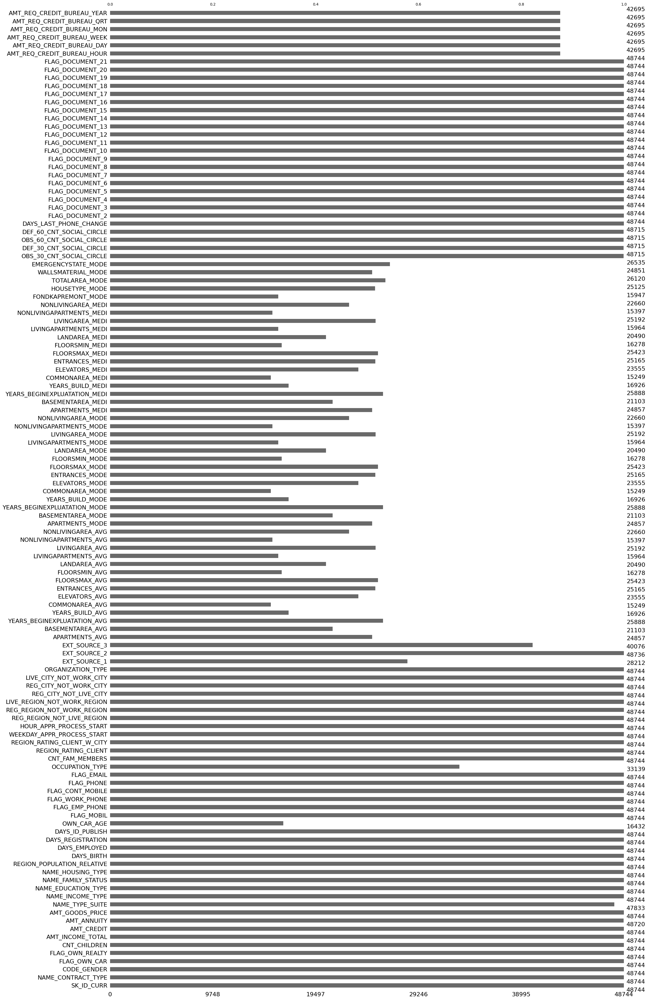

In [36]:
description_dataset(df_test, 'test data')

## application_train

In [37]:
df_train = pd.read_csv('/content/drive/MyDrive/Projet 7/application_train.csv', sep = ',')
df_train

In [38]:
df_train.shape

(307511, 122)

In [39]:
df_train.head(5)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

On traite le dataset  train data


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

Taille :-------------------------------------------------------------- (307511, 122)
----------------------------------------------------------------------------------------------------
Valeurs manquantes par colonnes (%): 
Durée d'exécution de missing_values: 1.4484806060791016s


,Valeurs manquantes,% total des valeurs
COMMONAREA_MEDI,214865,69.9
COMMONAREA_AVG,214865,69.9
COMMONAREA_MODE,214865,69.9
NONLIVINGAPARTMENTS_MEDI,213514,69.4
NONLIVINGAPARTMENTS_MODE,213514,69.4
NONLIVINGAPARTMENTS_AVG,213514,69.4
FONDKAPREMONT_MODE,210295,68.4
LIVINGAPARTMENTS_MODE,210199,68.4
LIVINGAPARTMENTS_MEDI,210199,68.4
LIVINGAPARTMENTS_AVG,210199,68.4


----------------------------------------------------------------------------------------------------
Valeurs différentes par variables : 
SK_ID_CURR------------------------------------------------------------ contient 307511 valeurs différentes
TARGET---------------------------------------------------------------- [1 0]
NAME_CONTRACT_TYPE---------------------------------------------------- ['Cash loans' 'Revolving loans']
CODE_GENDER----------------------------------------------------------- ['M' 'F' 'XNA']
FLAG_OWN_CAR---------------------------------------------------------- ['N' 'Y']
FLAG_OWN_REALTY------------------------------------------------------- ['Y' 'N']
CNT_CHILDREN---------------------------------------------------------- [ 0  1  2  3  4  7  5  6  8  9 11 12 10 19 14]
AMT_INCOME_TOTAL------------------------------------------------------ contient 2548 valeurs différentes
AMT_CREDIT------------------------------------------------------------ contient 5603 valeurs différent

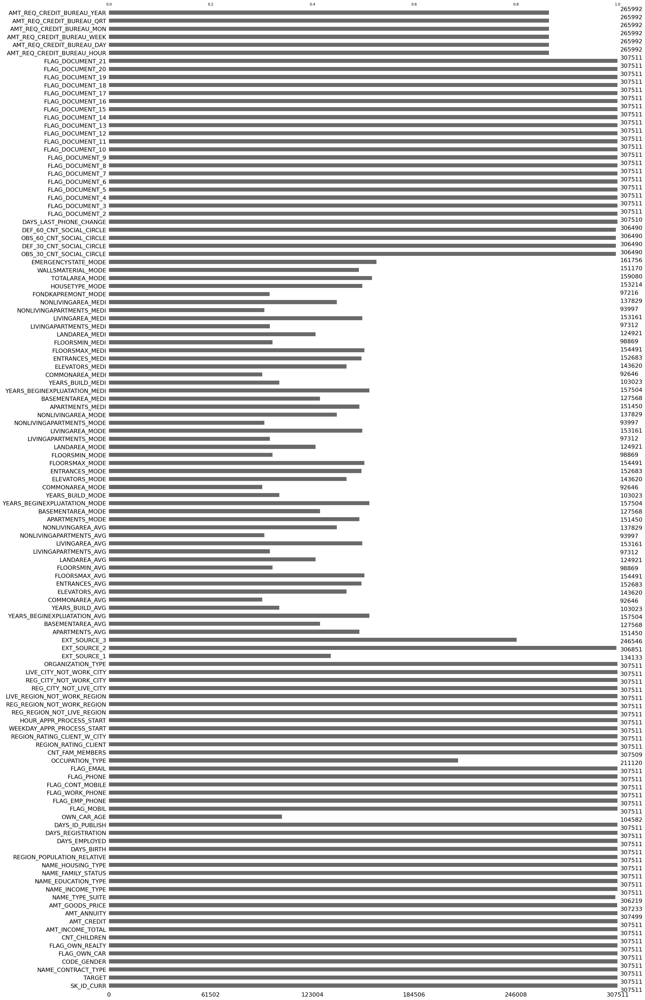

In [40]:
description_dataset(df_train, 'train data')

In [41]:
df_train.TARGET.value_counts(normalize=True)*100

0    91.927118
1     8.072882
Name: TARGET, dtype: float64

In [42]:
temp = df_train.TARGET.value_counts(normalize=True)*100
fig = {
  "data": [
    {
      "values": temp.values,
      "labels": temp.index,
      "domain": {"x": [0, .48]},
      #"name": "Types of Loans",
      #"hoverinfo":"label+percent+name",
      "hole": .7,
      "type": "pie"
    },

    ],
  "layout": {
    "title": {
        'text' : "Pourcentage de prêts remboursés",
        'x' : 0.17
        },
         "legend": {
         "x": 0.4,
         #"y": ,
    }


    }
}
iplot(fig, filename='donut')

On remarque que les catégories sont trés déséquilibrées.

Une methode tel que SMOTE, Class Weight, undersampling devra être utilisée afin de pas biaiser les résultats de l'algorithme de scoring.

### Nettoyage

In [43]:
df_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [44]:
df_train.NAME_CONTRACT_TYPE.value_counts(normalize=True)

Cash loans         0.904787
Revolving loans    0.095213
Name: NAME_CONTRACT_TYPE, dtype: float64

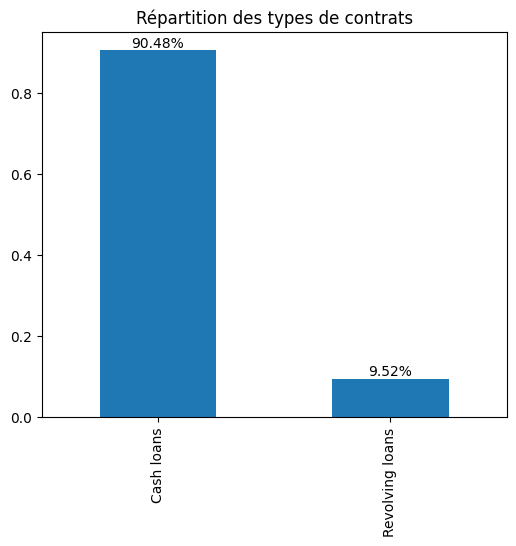

In [45]:
fig = plt.figure(figsize = (6,5))
value_counts = df_train.NAME_CONTRACT_TYPE.value_counts(normalize=True)
ax = value_counts.plot(kind='bar')

#df_train.NAME_CONTRACT_TYPE.value_counts(normalize=True).plot(kind = 'bar')
plt.title('Répartition des types de contrats')
# Ajoutez les valeurs au-dessus des barres
for i, v in enumerate(value_counts):
    ax.text(i, v, f'{v:.2%}', ha='center', va='bottom')
plt.show()

In [46]:
df_train.CODE_GENDER.value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

In [47]:
df_train.CODE_GENDER.value_counts(normalize=True)

F      0.658344
M      0.341643
XNA    0.000013
Name: CODE_GENDER, dtype: float64

In [48]:
df_train = df_train[df_train.CODE_GENDER != 'XNA']

In [49]:
df_train.CODE_GENDER.value_counts(normalize=True)

F    0.658352
M    0.341648
Name: CODE_GENDER, dtype: float64

In [50]:
import plotly.express as px
from plotly.offline import iplot
temp = df_train["CODE_GENDER"].value_counts()
fig = {
  "data": [
    {
      "values": temp.values,
      "labels": temp.index,
      "domain": {"x": [0, .48]},
      "name": "Types of Loans",
      #"hoverinfo":"label+percent+name",
      "hole": .7,
      "type": "pie"
    },

    ],
  "layout": {
       "title": {
        'text' : "Types of loan",
        'x' : 0.25
        },
         "legend": {
         "x": 0.4,
         #"y": ,
    }


    }
}
iplot(fig, filename='donut')

In [51]:
# on supprime le CODE_GENDER = XNA ( 4 valeurs)
df_train = df_train[df_train['CODE_GENDER'] != 'XNA']

In [52]:
 gender_counts = df_train.groupby(['TARGET','CODE_GENDER']).size().unstack()
 gender_counts

CODE_GENDER,F,M
TARGET,,
0,188278,94404
1,14170,10655


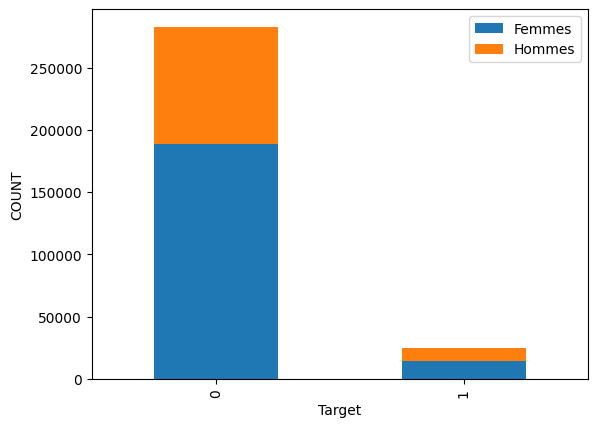

In [53]:
gender_counts.plot(kind='bar', stacked=True)
plt.xlabel('Target')
plt.xticks(rotation = 90)
plt.ylabel('COUNT')
plt.title('')
plt.legend(['Femmes', 'Hommes'])

plt.show()

In [54]:
import plotly.express as px
from plotly.offline import iplot
temp = df_train["FLAG_OWN_CAR"].value_counts()
fig = {
  "data": [
    {
      "values": temp.values,
      "labels": temp.index,
      "domain": {"x": [0, .48]},
      "name": "Types of Loans",
      #"hoverinfo":"label+percent+name",
      "hole": .7,
      "type": "pie"
    },

    ],
  "layout": {
       "title": {
        'text' : "Presence/absence une voiture",
        'x' : 0.25
        },
         "legend": {
         "x": 0.4,
         #"y": ,
    }


    }
}
iplot(fig, filename='donut')

In [55]:
car_counts = df_train.groupby(['TARGET','FLAG_OWN_CAR']).size().unstack()
car_counts

FLAG_OWN_CAR,N,Y
TARGET,,
0,185673,97009
1,17249,7576


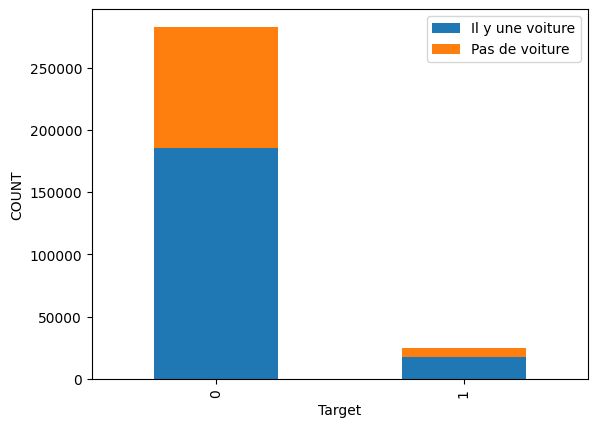

In [56]:
car_counts.plot(kind='bar', stacked=True)
plt.xlabel('Target')
plt.xticks(rotation = 90)
plt.ylabel('COUNT')
plt.title('')
plt.legend(['Il y une voiture', 'Pas de voiture'])

plt.show()

In [57]:

temp = df_train["FLAG_OWN_REALTY"].value_counts()
fig = {
  "data": [
    {
      "values": temp.values,
      "labels": temp.index,
      "domain": {"x": [0, .48]},
      "name": "Types of Loans",
      #"hoverinfo":"label+percent+name",
      "hole": .7,
      "type": "pie"
    },

    ],
  "layout": {
       "title": {
        'text' : "Presence/absence une maison",
        'x' : 0.18
        },
         "legend": {
         "x": 0.4,
         #"y": ,
    }


    }
}
iplot(fig, filename='donut')

In [58]:
maison_counts = df_train.groupby(['TARGET','FLAG_OWN_REALTY']).size().unstack()
maison_counts

FLAG_OWN_REALTY,N,Y
TARGET,,
0,86357,196325
1,7842,16983


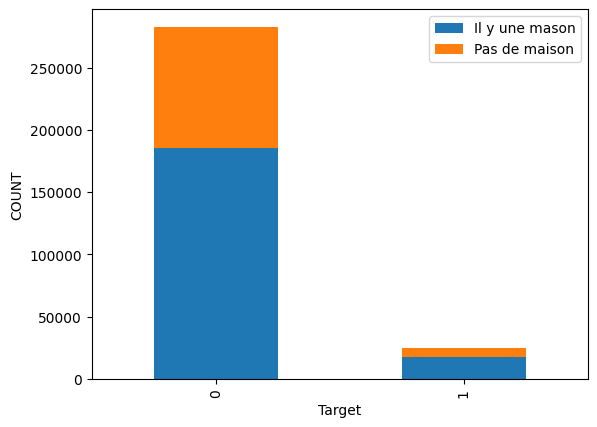

In [59]:
car_counts.plot(kind='bar', stacked=True)
plt.xlabel('Target')
plt.xticks(rotation = 90)
plt.ylabel('COUNT')
plt.title('')
plt.legend(['Il y une mason', 'Pas de maison'])

plt.show()

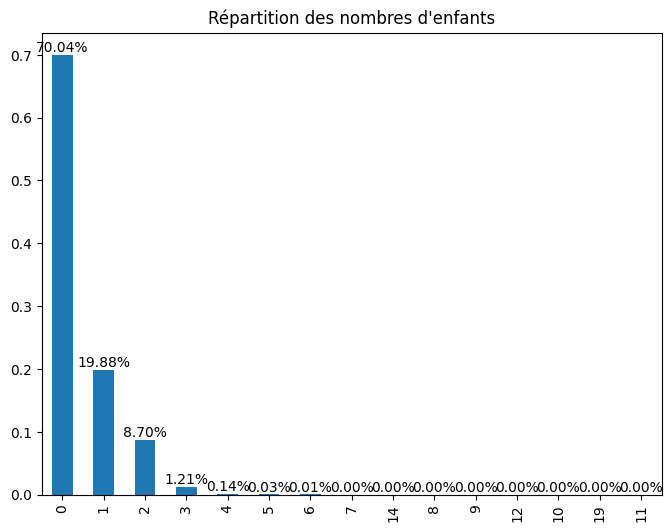

In [60]:
fig = plt.figure(figsize = (8,6))
value_counts = df_train.CNT_CHILDREN.value_counts(normalize=True)
ax = value_counts.plot(kind='bar')
plt.title("Répartition des nombres d'enfants")
# Ajoutez les valeurs au-dessus des barres
for i, v in enumerate(value_counts):
    ax.text(i, v, f'{v:.2%}', ha='center', va='bottom')
plt.show()

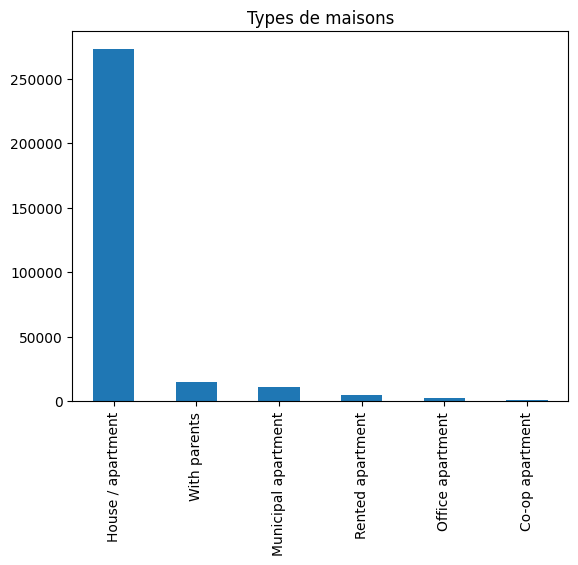

In [61]:
fig = plt.figure()
df_train.NAME_HOUSING_TYPE.value_counts().plot(kind = 'bar')
plt.title('Types de maisons')
plt.show()

In [62]:
df_train.NAME_FAMILY_STATUS.value_counts()

Married                 196429
Single / not married     45444
Civil marriage           29774
Separated                19770
Widow                    16088
Unknown                      2
Name: NAME_FAMILY_STATUS, dtype: int64

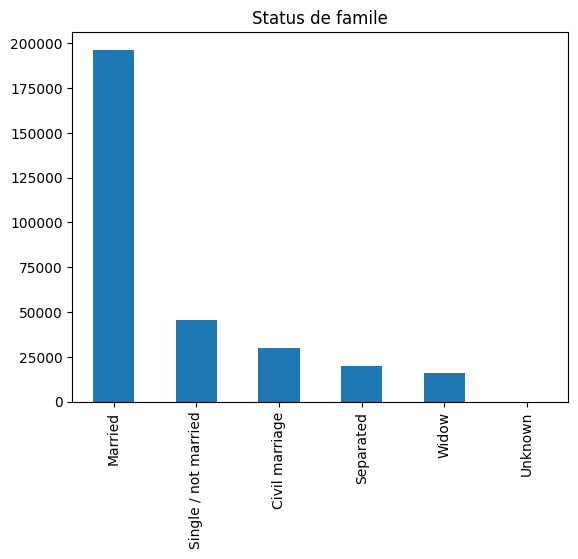

In [63]:
fig = plt.figure()
df_train.NAME_FAMILY_STATUS.value_counts().plot(kind = 'bar')
plt.title('Status de famile')
plt.show()

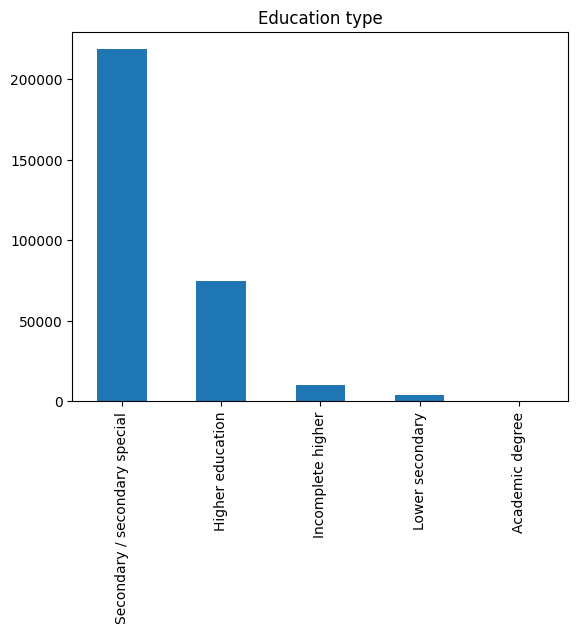

In [64]:
fig = plt.figure()
df_train.NAME_EDUCATION_TYPE.value_counts().plot(kind = 'bar')
plt.title('Education type')
plt.show()

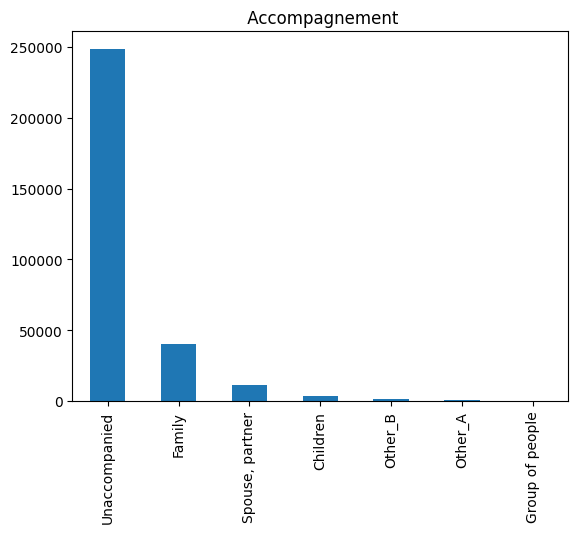

In [65]:
fig = plt.figure()
df_train.NAME_TYPE_SUITE.value_counts().plot(kind = 'bar')
plt.title(' Accompagnement')
plt.show()



In [66]:
df_train.NAME_INCOME_TYPE.value_counts()

Working                 158771
Commercial associate     71616
Pensioner                55362
State servant            21703
Unemployed                  22
Student                     18
Businessman                 10
Maternity leave              5
Name: NAME_INCOME_TYPE, dtype: int64

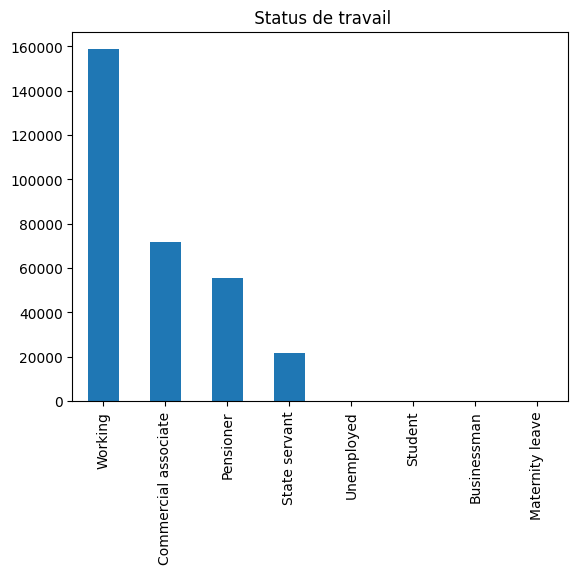

In [67]:
fig = plt.figure()
df_train.NAME_INCOME_TYPE.value_counts().plot(kind = 'bar')
plt.title(' Status de travail')
plt.show()

In [68]:
# Supprime les individus dont 'NAME_INCOME_TYPE' vient d'un congé maternité car cas inexistant dans test et 5 occurences
df_train = df_train[df_train.NAME_INCOME_TYPE != 'Maternity leave']

In [69]:
# Supprime les individus dont la statut familial est inconnu
df_train = df_train[df_train['NAME_FAMILY_STATUS'] != 'Unknown']


In [70]:
abs(df_train['DAYS_BIRTH']/365)

0         25.920548
1         45.931507
2         52.180822
3         52.068493
4         54.608219
5         46.413699
6         37.747945
7         51.643836
8         55.065753
9         39.641096
10        27.936986
11        55.936986
12        36.819178
13        38.591781
14        39.953425
15        23.912329
16        35.427397
17        26.783562
18        48.542466
19        31.090411
20        50.005479
21        40.589041
22        30.536986
23        68.019178
24        30.920548
25        52.969863
26        51.298630
27        43.693151
28        27.380822
29        28.331507
30        41.863014
31        30.531507
32        35.545205
33        32.038356
34        43.827397
35        33.309589
36        47.120548
37        57.745205
38        65.534247
39        44.180822
40        47.895890
41        46.495890
42        36.668493
43        64.515068
44        26.923288
45        21.846575
46        55.816438
47        55.126027
48        54.046575
49        50.038356


<Axes: >

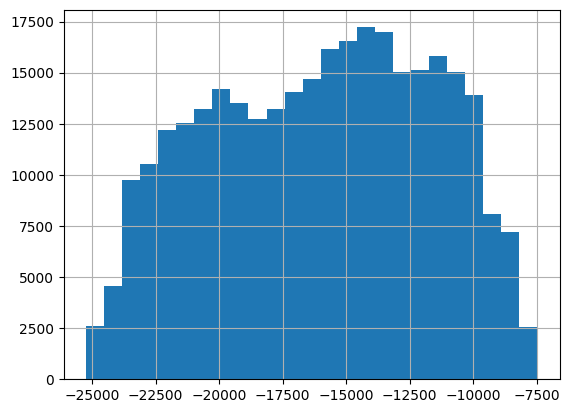

In [71]:
df_train['DAYS_BIRTH'].hist(bins = 25)

<Axes: >

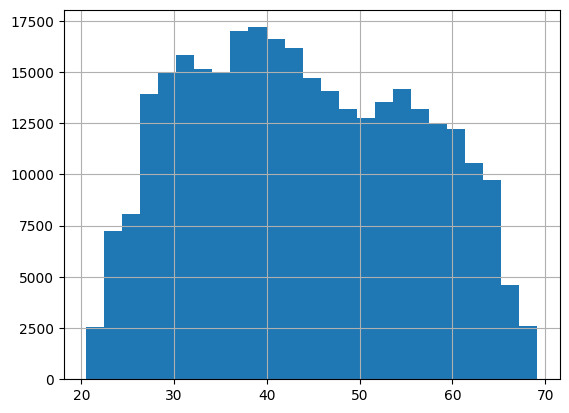

In [72]:
abs(df_train['DAYS_BIRTH']/365).hist(bins = 25)

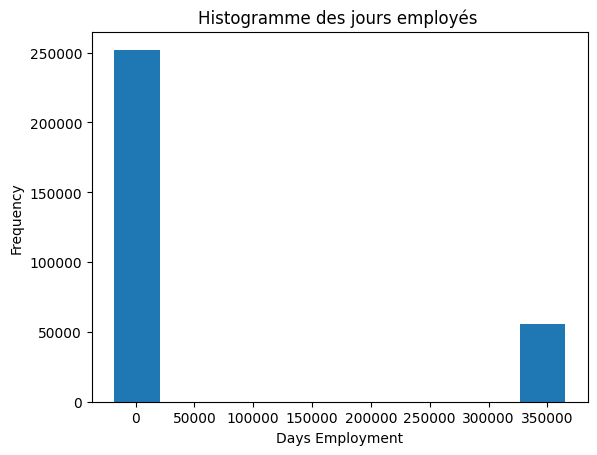

In [73]:
df_train['DAYS_EMPLOYED'].plot.hist(title = 'Histogramme des jours employés ');
plt.xlabel('Days Employment')
plt.show()

In [75]:
df_train[df_train.DAYS_EMPLOYED == 365243]

<Axes: >

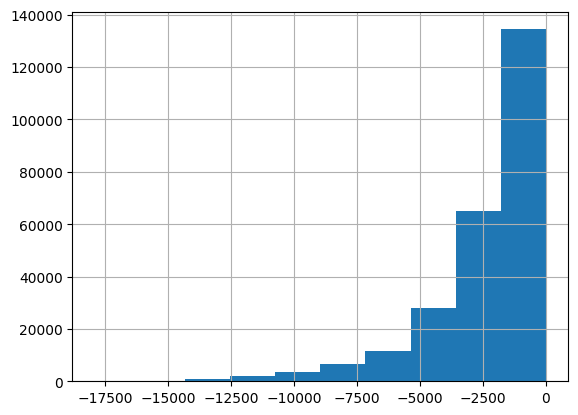

In [76]:
df_train[df_train.DAYS_EMPLOYED != 365243].DAYS_EMPLOYED.hist()

In [77]:
abs(df_train[df_train.DAYS_EMPLOYED != 365243].DAYS_EMPLOYED/365).describe()

count    252126.000000
mean          6.531920
std           6.406438
min           0.000000
25%           2.101370
50%           4.515068
75%           8.698630
max          49.073973
Name: DAYS_EMPLOYED, dtype: float64

<Axes: >

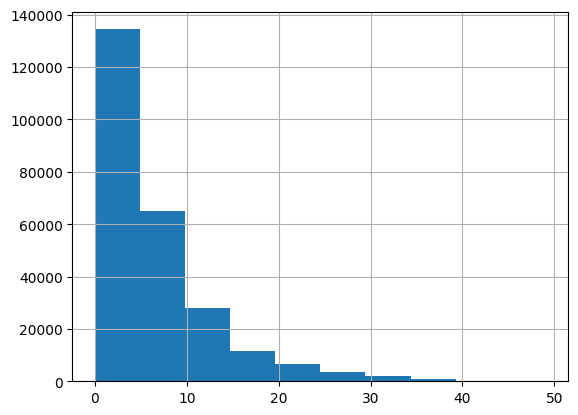

In [78]:
abs(df_train[df_train.DAYS_EMPLOYED != 365243].DAYS_EMPLOYED/365).hist()

<Axes: >

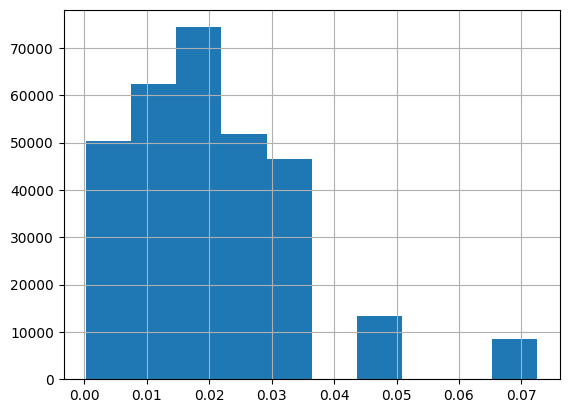

In [79]:
df_train.REGION_POPULATION_RELATIVE.hist()

In [80]:
df_train.CNT_FAM_MEMBERS.value_counts()

2.0     158354
1.0      67847
3.0      52599
4.0      24693
5.0       3478
6.0        408
7.0         81
8.0         20
9.0          6
10.0         3
14.0         2
12.0         2
20.0         2
16.0         2
13.0         1
15.0         1
11.0         1
Name: CNT_FAM_MEMBERS, dtype: int64

In [81]:
cols_to_clean = ["NAME_CONTRACT_TYPE",
        "NAME_TYPE_SUITE",
        "OCCUPATION_TYPE",
        "WALLSMATERIAL_MODE",
        "HOUSETYPE_MODE",
        "NAME_HOUSING_TYPE",
        "NAME_FAMILY_STATUS"]

In [82]:
for cols in cols_to_clean:
    df_train[cols] = df_train[cols].apply(lambda x : cleaning_categories(x))

In [83]:
for cols in cols_to_clean:
    df_test[cols] = df_test[cols].apply(lambda x : cleaning_categories(x))

In [91]:
df_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,CASH LOANS,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,UNACCOMPANIED,Working,Secondary / secondary special,SINGLE NOT MARRIED,HOUSE APARTMENT,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,LABORERS,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,BLOCK OF FLATS,0.0149,"STONE, BRICK",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,CASH LOANS,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,FAMILY,State servant,Higher education,MARRIED,HOUSE APARTMENT,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,CORE STAFF,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,BLOCK OF FLATS,0.0714,BLOCK,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,REVOLVING LOANS,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,UNACCOMPANIED,Working,Secondary / secondary special,SINGLE NOT MARRIED,HOUSE APARTMENT,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,LABORERS,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [92]:
df_train.iloc[:, 1:].describe().T

,count,mean,std,min,25%,50%,75%,max
TARGET,307500.0,0.080725,0.272413,0.000000e+00,0.000000,0.000000,0.000000,1.000000e+00
CNT_CHILDREN,307500.0,0.417034,0.722108,0.000000e+00,0.000000,0.000000,1.000000,1.900000e+01
AMT_INCOME_TOTAL,307500.0,168797.123450,237126.307223,2.565000e+04,112500.000000,147150.000000,202500.000000,1.170000e+08
AMT_CREDIT,307500.0,599025.945351,402493.590146,4.500000e+04,270000.000000,513531.000000,808650.000000,4.050000e+06
AMT_ANNUITY,307488.0,27108.477604,14493.600189,1.615500e+03,16524.000000,24903.000000,34596.000000,2.580255e+05
AMT_GOODS_PRICE,307224.0,538394.285593,369445.877860,4.050000e+04,238500.000000,450000.000000,679500.000000,4.050000e+06
REGION_POPULATION_RELATIVE,307500.0,0.020868,0.013831,2.900000e-04,0.010006,0.018850,0.028663,7.250800e-02
DAYS_BIRTH,307500.0,-16037.069246,4363.988872,-2.522900e+04,-19682.000000,-15750.000000,-12413.000000,-7.489000e+03
DAYS_EMPLOYED,307500.0,63817.429333,141277.730537,-1.791200e+04,-2760.000000,-1213.000000,-289.000000,3.652430e+05
DAYS_REGISTRATION,307500.0,-4986.152449,3522.883278,-2.467200e+04,-7479.250000,-4504.000000,-2010.000000,0.000000e+00


Les jours sont négatifs pour les variables DAYS_
Un ou plusieurs véhicules ont 91 ans

In [93]:

df_train.OWN_CAR_AGE.value_counts().sort_index(ascending = False).head(20)

91.0       2
69.0       1
65.0     891
64.0    2443
63.0       2
57.0       1
56.0       1
55.0       4
54.0      12
52.0       1
51.0       3
50.0       1
49.0       6
48.0       1
47.0       1
46.0       5
45.0      11
44.0      21
43.0      19
42.0      42
Name: OWN_CAR_AGE, dtype: int64

Plusieurs véhicules ont 64 ans, ou même sont plus vieux. Cela peut être des véhicules de collections

91 ans est conservé comme valeurs atypique()

Text(0.5, 0, 'Days Employment')

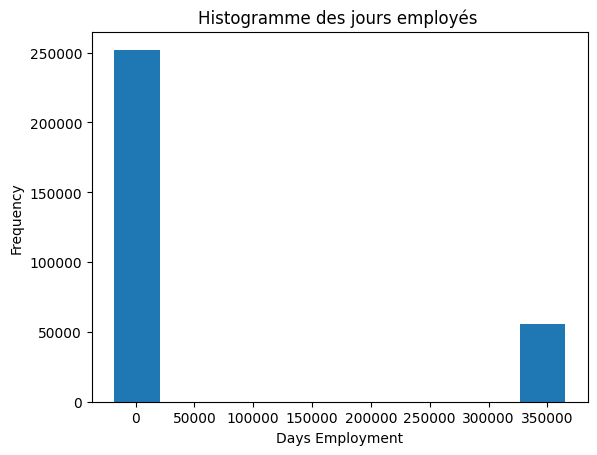

In [95]:
df_train['DAYS_EMPLOYED'].plot.hist(title = 'Histogramme des jours employés ');
plt.xlabel('Days Employment')

Dans ce cas, puisque toutes les anomalies ont exactement
la même valeur, nous voulons les compléter avec la même
valeur au cas où tous ces prêts ont quelque chose en commun.
Les valeurs anormales semblent avoir une certaine importance,
nous voulons donc indiquer au modèle d'apprentissage automatique
si nous avons effectivement rempli ces valeurs.

Comme solution, nous allons remplir les valeurs anormales
avec un nombre nul (np.nan) et ensuite créer une nouvelle
colonne booléenne indiquant si la valeur était anormale ou non.

Text(0.5, 0, 'Days Employment')

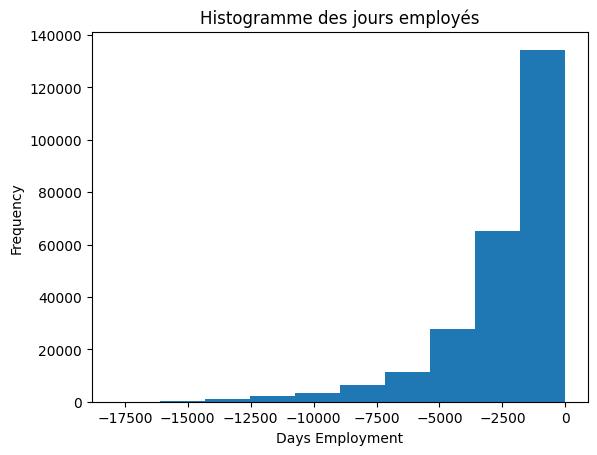

In [96]:
#Création d'une colonne avec le label d'anomalie
df_train['DAYS_EMPLOYED_ANOM'] = df_train["DAYS_EMPLOYED"] == 365243

#On remplace les outliers par des nan
df_train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

df_train['DAYS_EMPLOYED'].plot.hist(title = 'Histogramme des jours employés');
plt.xlabel('Days Employment')

In [97]:
df_test.describe()

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744.000000,48744.000000,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,16432.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,28212.000000,48736.000000,40076.000000,24857.000000,21103.000000,25888.000000,16926.000000,15249.000000,23555.000000,25165.000000,25423.000000,16278.000000,20490.000000,15964.000000,25192.000000,15397.000000,22660.000000,24857.000000,21103.000000,25888.000000,16926.000000,15249.000000,23555.000000,25165.000000,25423.000000,16278.000000,20490.000000,15964.000000,25192.000000,15397.000000,22660.000000,24857.000000,21103.000000,25888.000000,16926.000000,15249.000000,23555.000000,25165.000000,25423.000000,16278.000000,20490.000000,15964.000000,25192.000000,15397.000000,22660.000000,26120.000000,48715.000000,48715.000000,48715.000000,48715.000000,48744.000000,48744.0,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.0,48744.000000,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.000000,48744.0,48744.0,48744.0,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000
mean,277796.676350,0.397054,1.784318e+05,5.167404e+05,29426.240209,4.626188e+05,0.021226,-16068.084605,67485.366322,-4967.652716,-3051.712949,11.786027,0.999979,0.809720,0.204702,0.998400,0.263130,0.162646,2.146767,2.038159,2.012596,12.007365,0.018833,0.055166,0.042036,0.077466,0.224664,0.174216,0.501180,0.518021,0.500106,0.122388,0.090065,0.978828,0.751137,0.047624,0.085168,0.151777,0.233706,0.238423,0.067192,0.105885,0.112286,0.009231,0.029387,0.119078,0.088998,0.978292,0.758327,0.045223,0.080570,0.147161,0.229390,0.233854,0.065914,0.110874,0.110687,0.008358,0.028161,0.122809,0.089529,0.978822,0.754344,0.047420,0.084128,0.151200,0.233154,0.237846,0.068069,0.107063,0.113368,0.008979,0.029296,0.107129,1.447644,0.143652,1.435738,0.101139,-1077.766228,0.0,0.786620,

In [99]:
df_test['DAYS_EMPLOYED_ANOM'] = df_test["DAYS_EMPLOYED"] == 365243
df_test["DAYS_EMPLOYED"].replace({365243: np.nan}, inplace = True)

In [100]:
df_train.to_csv('df_train.csv', sep = ',')
df_test.to_csv('df_test.csv', sep = ',')

## Corrélations

In [ ]:
#Trouvons les corrélations avec la target et trions les
correlations = df_train.corr()['TARGET'].sort_values()

In [ ]:
# Display correlations
print('Most Positive Correlations:\n', correlations.tail(15))
print('\nMost Negative Correlations:\n', correlations.head(15))

La corrélation DAYS_BIRTH est la plus positive.
La corrélation est positive, mais la valeur de cette caractéristique
est en fait négative, ce qui signifie que plus le client vieillit, moins il est susceptible de ne pas rembourser son prêt (c'est-à-dire que la cible == 0).

C'est un peu déroutant, nous allons donc prendre
la valeur absolue de la caractéristique et la corrélation sera alors négative.

In [ ]:
# Find the correlation of the positive days since birth and target
df_train['DAYS_BIRTH'] = abs(df_train['DAYS_BIRTH'])
print("Corrélation entre l'âge du client au moment du prêt et la TARGET :", df_train['DAYS_BIRTH'].corr(df_train['TARGET']))


In [ ]:
# choix du style du tracé
plt.style.use('fivethirtyeight')

# Tracé de la distribution des ages
plt.figure(figsize=(10,5))
plt.hist(df_train['DAYS_BIRTH'] / 365, edgecolor = 'k', bins = 25)
plt.title('Age du Client'); plt.xlabel('Age (années)'); plt.ylabel('Count');


Les variables avec les plus fortes corrélations négatives sont les variables EXT.

Montrons les corrélations des caractéristiques EXT_SOURCE avec la cible et entre elles.

In [ ]:
ext_data = df_train[['TARGET',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'OWN_CAR_AGE',
 'REGION_RATING_CLIENT',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3']]

plt.figure(figsize = (22, 22))
mask = np.triu(np.ones_like(ext_data.corr()))

# Heatmap of correlations
sns.heatmap(ext_data.corr(),mask = mask, cmap = plt.cm.Spectral,square=True, vmin = -0.25, annot = True, vmax = 0.6)
plt.title('Correlation Heatmap');

## Feature engineering


*   Création de nouvelles variables simples
*   Catégorisation des variables binaires

*   Imputation des valeurs manquantes
*   Encodage des variables catégorielles
*   Normalisation des variables numériques


In [ ]:
df_train.reset_index(drop=True, inplace=True)
df_test.reset_index(drop=True, inplace=True)


train = df_train.copy()
test = df_test.copy()

In [ ]:
#Récupération des identifiants clients et des labels
train_ids = train["SK_ID_CURR"]
test_ids = test["SK_ID_CURR"]

labels = train.TARGET

In [ ]:
features_set, test_features_set = clean_data(train,test)

In [ ]:
features_set = features_set.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
test_features_set = test_features_set.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

In [ ]:
test_features = test_features_set.reset_index()

In [ ]:
test_features.to_csv("test_preprocess.csv", index=False)

In [ ]:
# Sauvegarde de test_set nettoyé
pickle.dump(test_features_set, open( "test_preprocess.p", "wb"))

# Sauvegarde de train_set nettoyé
with open('fichier_train_preprocess.pickle', 'wb') as fichier:
    pickle.dump(features_set, fichier, pickle.HIGHEST_PROTOCOL)

## Modélisation

In [ ]:
seed = 42

In [ ]:
df_X = features_set.drop(columns = 'TARGET')
df_y = features_set['TARGET']
train_set, val_set, train_labels, val_labels = echantillonage(df_X,df_y)

Durée d'exécution de echantillonage: 1.071603536605835s


In [ ]:
train_set['TARGET']=train_labels
val_set['TARGET']=val_labels

In [ ]:
train_set = train_set.reset_index()

In [ ]:
sample_X = features_set.drop(columns = 'TARGET').sample(n= 60000)
sample_y = features_set['TARGET'][sample_X.index]

train_sample_set, val_sample_set, train_sample_labels, val_sample_labels = echantillonage(sample_X,sample_y)

Durée d'exécution de echantillonage: 0.15352535247802734s


In [ ]:
train_sample_set['TARGET']=train_sample_labels
val_sample_set['TARGET']=val_sample_labels


train_sample_set = train_sample_set.reset_index()

In [ ]:
print('train shape :',train_set.shape)
print('validation shape :',val_set.shape)


print('train sample shape :',train_sample_set.shape)
print('validation sample shape :',val_sample_set.shape)

train shape : (246000, 262)
validation shape : (61500, 261)
train sample shape : (48000, 262)
validation sample shape : (12000, 261)


In [ ]:
#sauvegarde des train set et val set
pickle.dump( train_set, open( "train_set.p", "wb" ) )
pickle.dump( val_set, open( "val_set.p", "wb" ) )

In [ ]:
#chargement des train set et val set
train_set = pickle.load( open( "train_set.p", "rb" ) )
val_set = pickle.load( open( "val_set.p", "rb" ) )

## Baseline

In [ ]:
# Dictionnaire de classifieurs
classifieurs = { 'Dummy Classifier': DummyClassifier(),
                  'Logistic Regression': LogisticRegression(solver='lbfgs', max_iter=1000),
                  ##'SVM' : SVR(),
                  'LGBM': lgb.LGBMClassifier()
              }

Dummy Classifier
Logistic Regression
LGBM
[LightGBM] [Info] Number of positive: 3023, number of negative: 35377
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13065
[LightGBM] [Info] Number of data points in the train set: 38400, number of used features: 232
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.078724 -> initscore=-2.459812
[LightGBM] [Info] Start training from score -2.459812
[LightGBM] [Info] Number of positive: 3032, number of negative: 35368
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014967 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13071
[LightGBM] [Info] Number of data points in the train set: 3840

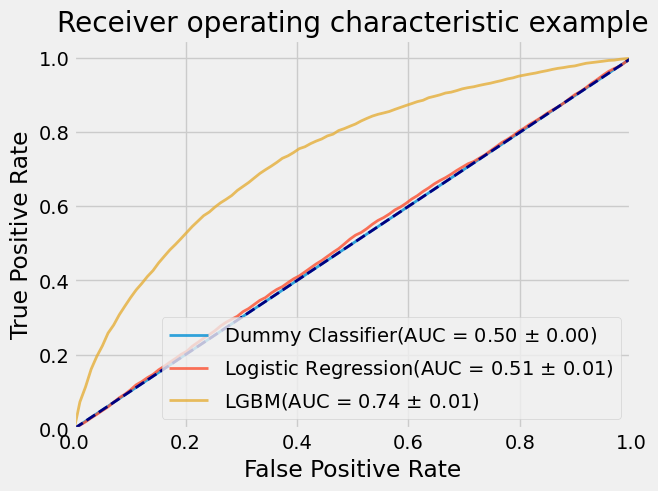

Durée d'exécution de plot_roc_curve: 8.826169967651367s


In [ ]:
plot_roc_curve(classifieurs,train_sample_set.drop(columns = 'TARGET'),train_sample_labels, n_splits = 5)

In [ ]:
# Dictionnaire de classifieurs
classifieurs = { 'Dummy Classifier': DummyClassifier(),
                  'Logistic Regression': LogisticRegression(solver='lbfgs', max_iter=1000),
                  'SVM' : SVC(kernel='sigmoid', probability=True) ,
                      'LGBM': lgb.LGBMClassifier()

                 }

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

In [ ]:
#
# Dictionnaire de classifieurs
classifieurs = { 'Dummy Classifier': DummyClassifier(),
                  'Logistic Regression': LogisticRegression(solver='lbfgs', max_iter=1000),
                  'AdaBoost' : AdaBoostClassifier() ,
                      'LGBM': lgb.LGBMClassifier()

                 }

Dummy Classifier
Logistic Regression
AdaBoost
LGBM
[LightGBM] [Info] Number of positive: 3023, number of negative: 35377
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010854 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13065
[LightGBM] [Info] Number of data points in the train set: 38400, number of used features: 232
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.078724 -> initscore=-2.459812
[LightGBM] [Info] Start training from score -2.459812
[LightGBM] [Info] Number of positive: 3032, number of negative: 35368
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010753 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13071
[LightGBM] [Info] Number of data points in the train 

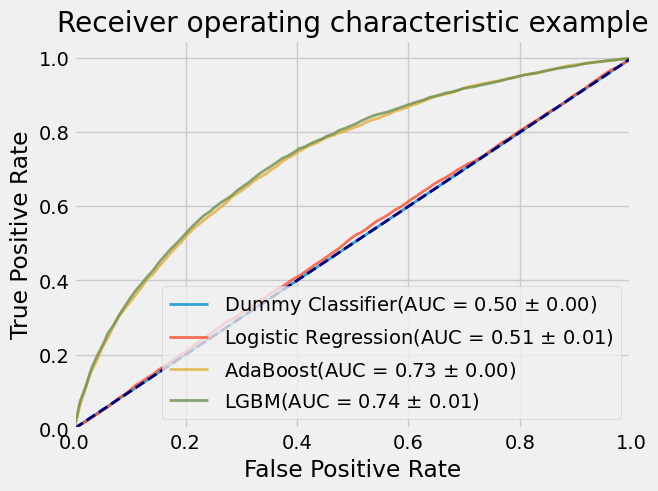

Durée d'exécution de plot_roc_curve: 64.93736982345581s


In [ ]:
plot_roc_curve(classifieurs,train_sample_set.drop(columns = 'TARGET'),train_sample_labels, n_splits = 5)

## Rééquilibrage et choix du modèle

In [ ]:
best_par_0, feat_imp_0, model_0 = optimisation_model(train_sample_set, lgb.LGBMClassifier(),metric = cout_metier, n_ite_baye=5)

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

In [ ]:
best_par_0

{'colsample_by_tree': 0.8,
 'learning_rate': 0.15337786324322056,
 'max_depth': 6.0,
 'n_estimators': 1400.0,
 'num_leaves': 76.0,
 'reg_alpha': 1.0,
 'reg_lambda': 0.30000000000000004,
 'seuil': 0.9500000000000001,
 'subsample': 0.4}

Durée d'exécution de gain_seuil: 86.50845646858215s


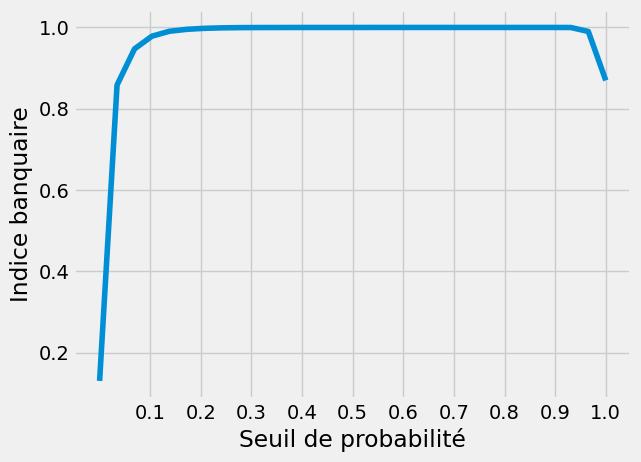

In [ ]:
gain_seuil(model_0, train_sample_labels, train_sample_set.drop(columns = ['TARGET','SK_ID_CURR']))

In [ ]:
y_proba = model_0.predict_proba(val_sample_set.drop(columns = ['TARGET']))[:, 1]
y_pred_proba = y_proba > best_par_0['seuil']
y_pred_proba = np.array(y_pred_proba > 0)*1

# Si proba > seuil alors la prédiction est positive : 1
score= roc_auc_score(val_sample_labels,y_pred_proba)

print ("ROC auc score : ",score)
print("métrique métier : ",cout_metier(val_sample_labels,y_pred_proba))

ROC auc score :  0.5027566808673105
métrique métier :  0.8712134632418068


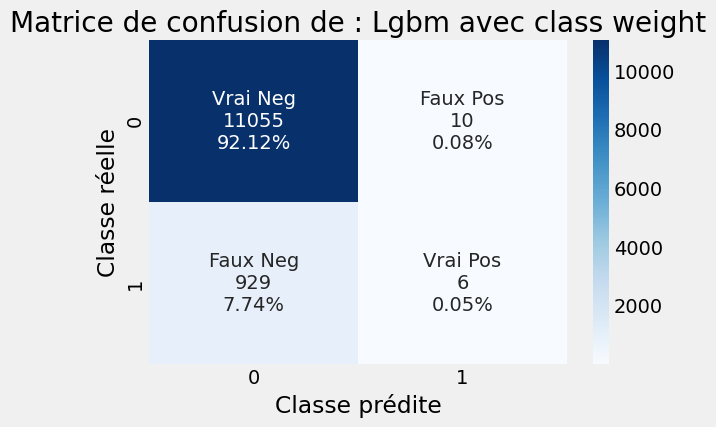

Durée d'exécution de afficher_matrice_confusion: 0.23092269897460938s


In [ ]:
afficher_matrice_confusion(val_sample_labels,y_pred_proba, "Lgbm avec class weight")

## Smote

In [ ]:
best_par_smote, feat_imp_smote, model_smote = optimisation_model(train_sample_set, lgb.LGBMClassifier(),metric = cout_metier,smote = True, n_ite_baye=5)


[LightGBM] [Info] Number of positive: 35375, number of negative: 35375
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.059886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 46476
[LightGBM] [Info] Number of data points in the train set: 70750, number of used features: 236
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 35354, number of negative: 35354
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.061845 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 46829
[LightGBM] [Info] Number of data points in the train set: 70708, number of used features: 236
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 35404, number of negative: 35404
[LightGBM] [Warning] Auto-choosing col-wi

In [ ]:
best_par_smote

{'colsample_by_tree': 0.9,
 'learning_rate': 0.06168949267895693,
 'max_depth': 14.0,
 'n_estimators': 1800.0,
 'num_leaves': 92.0,
 'reg_alpha': 0.1,
 'reg_lambda': 0.6000000000000001,
 'seuil': 0.7250000000000001,
 'subsample': 0.6000000000000001}

Durée d'exécution de gain_seuil: 150.19248938560486s


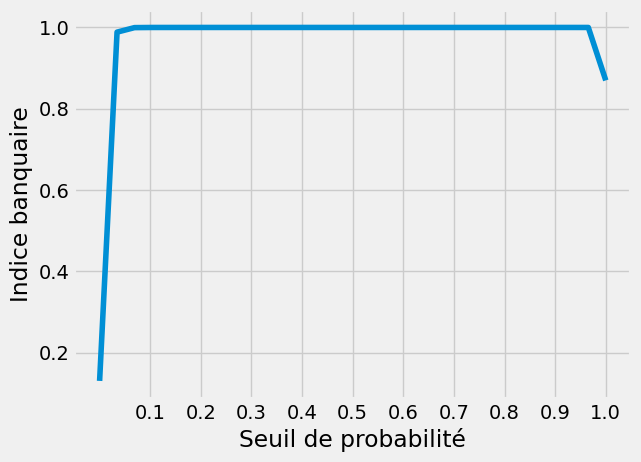

In [ ]:
gain_seuil(model_smote, train_sample_labels, train_sample_set.drop(columns = ["SK_ID_CURR",'TARGET']))

In [ ]:
y_proba_smote = model_smote.predict_proba(val_sample_set.drop(columns = ['TARGET']))[:, 1]
y_pred_proba_smote = y_proba_smote > best_par_smote['seuil']
y_pred_proba_smote = np.array(y_pred_proba_smote > 0)*1

# Si proba > seuil alors la prédiction est positive : 1
score_smote= roc_auc_score(val_sample_labels,y_pred_proba_smote)

print ("ROC auc score : ",score_smote)
print("métrique métier : ",cout_metier(val_sample_labels,y_pred_proba_smote))

ROC auc score :  0.5101379548656335
métrique métier :  0.871370928058262


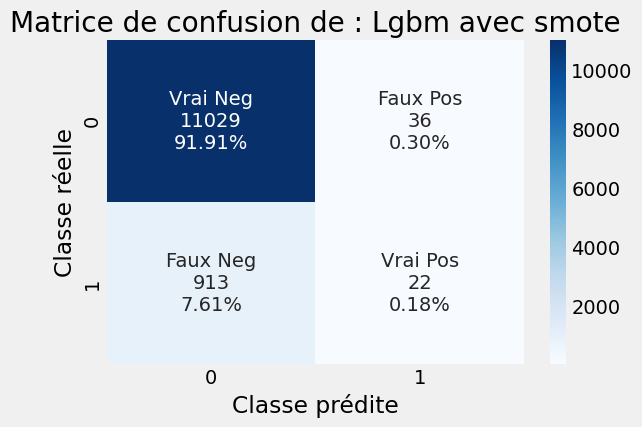

Durée d'exécution de afficher_matrice_confusion: 0.2284717559814453s


In [ ]:
afficher_matrice_confusion(val_sample_labels,y_pred_proba_smote, "Lgbm avec smote")

### UnderSampling

In [ ]:
best_parameters_us, feature_importance_us, model_us = optimisation_model(train_sample_set, lgb.LGBMClassifier(),
                                                                             metric=cout_metier, under=True,
                                                                             n_ite_baye=5
                                                                             )

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

In [ ]:
best_parameters_us

{'colsample_by_tree': 0.8,
 'learning_rate': 0.005170008281056107,
 'max_depth': 18.0,
 'n_estimators': 600.0,
 'num_leaves': 36.0,
 'reg_alpha': 0.4,
 'reg_lambda': 0.8,
 'seuil': 0.925,
 'subsample': 0.2}

Durée d'exécution de gain_seuil: 39.84939193725586s


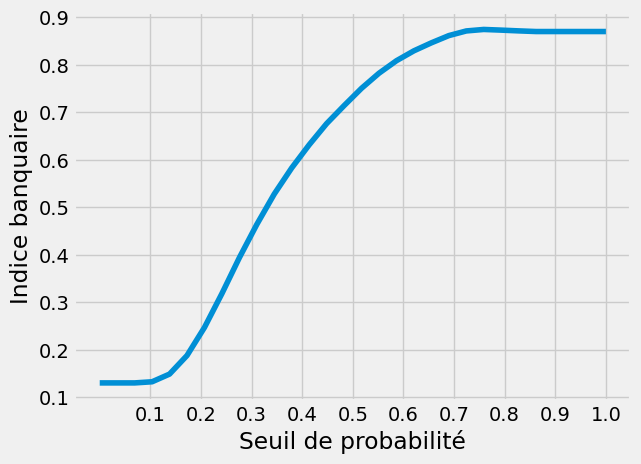

In [ ]:
gain_seuil(model_us, train_sample_labels, train_sample_set.drop(columns = ["SK_ID_CURR",'TARGET']))

In [ ]:
y_proba_us = model_us.predict_proba(val_sample_set.drop(columns = ['TARGET']))[:, 1]
y_pred_proba_us = y_proba_us > best_parameters_us['seuil']
y_pred_proba_us = np.array(y_pred_proba_us > 0)*1

# Si proba > seuil alors la prédiction est positive : 1
score_us= roc_auc_score(val_sample_labels,y_pred_proba_us)

print ("ROC auc score : ",score_us)
print("métrique métier : ",cout_metier(val_sample_labels,y_pred_proba_us))

ROC auc score :  0.5
métrique métier :  0.8711740970376931


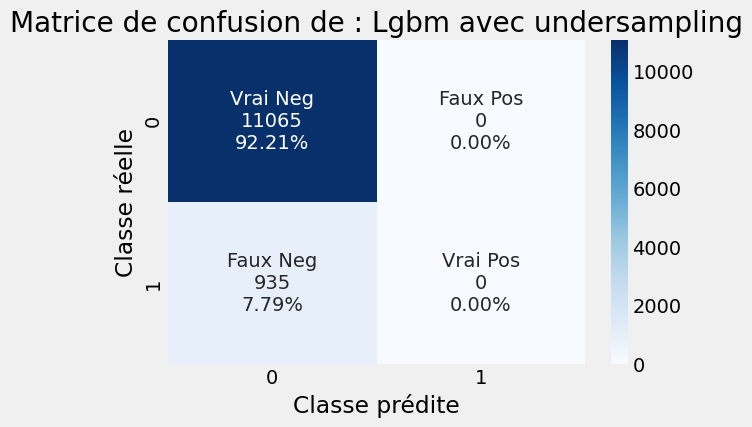

Durée d'exécution de afficher_matrice_confusion: 0.23494958877563477s


In [ ]:
afficher_matrice_confusion(val_sample_labels,y_pred_proba_us, "Lgbm avec undersampling")

In [ ]:
#Dictionnaire de modèles
dict_model={'class_weight':model_0,
            'Over_sampling':model_smote,
            'Under_sampling':model_us
           }

In [ ]:
name,score, target_0, target_1=score_validation_set(dict_model)

val_list={'Sampling':'True_val',
          'Pred_0':(val_sample_set['TARGET'].value_counts()/len(val_sample_set)*100)[0].item(),
          'Pred_1':(val_sample_set['TARGET'].value_counts()/len(val_sample_set)*100)[1].item()}

df_score=pd.DataFrame()
df_score['Sampling']=name
df_score['metrique metier']=score
df_score['Pred_0']=target_0
df_score['Pred_1']=target_1
df_score

,Sampling,metrique metier,Pred_0,Pred_1
0,class_weight,0.880030,96.177236,3.822764
1,Over_sampling,0.885909,97.634146,2.365854
2,Under_sampling,0.713750,71.910569,28.089431


In [ ]:
df_score['metrique metier']=df_score['metrique metier']*100
df_score.loc[3] = val_list

In [ ]:
df_score

,Sampling,metrique metier,Pred_0,Pred_1
0,class_weight,88.002987,96.177236,3.822764
1,Over_sampling,88.590907,97.634146,2.365854
2,Under_sampling,71.375005,71.910569,28.089431
3,True_val,NaN,92.208333,7.791667


## bureau

In [ ]:
bureau = pd.read_csv('/content/drive/MyDrive/Projet 7/bureau.csv', sep = ',')
bureau

In [ ]:
bureau.shape

(1716428, 17)

In [ ]:
bureau.head(5)

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


## bureau_balance

In [ ]:
bureau_balance = pd.read_csv('/content/drive/MyDrive/Projet 7/bureau_balance.csv', sep = ',')
bureau_balance

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C
...,...,...,...
27299920,5041336,-47,X
27299921,5041336,-48,X
27299922,5041336,-49,X
27299923,5041336,-50,X


In [ ]:
bureau_balance.shape

(27299925, 3)

In [ ]:
bureau_balance.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


## credit_card_balance

In [ ]:
credit_carte = pd.read_csv('/content/drive/MyDrive/Projet 7/credit_card_balance.csv', sep = ',')
credit_carte

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3840307,1036507,328243,-9,0.000,45000,NaN,0.0,NaN,NaN,0.000,...,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
3840308,1714892,347207,-9,0.000,45000,0.0,0.0,0.0,0.0,0.000,...,0.000,0.000,0.0,0,0.0,0.0,23.0,Active,0,0
3840309,1302323,215757,-9,275784.975,585000,270000.0,270000.0,0.0,0.0,2250.000,...,273093.975,273093.975,2.0,2,0.0,0.0,18.0,Active,0,0
3840310,1624872,430337,-10,0.000,450000,NaN,0.0,NaN,NaN,0.000,...,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0


## installments_payments

In [ ]:
payments = pd.read_csv('/content/drive/MyDrive/Projet 7/installments_payments.csv', sep = ',')
payments

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585
...,...,...,...,...,...,...,...,...
13605396,2186857,428057,0.0,66,-1624.0,NaN,67.500,NaN
13605397,1310347,414406,0.0,47,-1539.0,NaN,67.500,NaN
13605398,1308766,402199,0.0,43,-7.0,NaN,43737.435,NaN
13605399,1062206,409297,0.0,43,-1986.0,NaN,67.500,NaN


## previous_application

In [ ]:
apps = pd.read_csv('/content/drive/MyDrive/Projet 7/previous_application.csv', sep = ',')
apps

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670209,2300464,352015,Consumer loans,14704.290,267295.5,311400.0,0.0,267295.5,WEDNESDAY,12,...,Furniture,30.0,low_normal,POS industry with interest,365243.0,-508.0,362.0,-358.0,-351.0,0.0
1670210,2357031,334635,Consumer loans,6622.020,87750.0,64291.5,29250.0,87750.0,TUESDAY,15,...,Furniture,12.0,middle,POS industry with interest,365243.0,-1604.0,-1274.0,-1304.0,-1297.0,0.0
1670211,2659632,249544,Consumer loans,11520.855,105237.0,102523.5,10525.5,105237.0,MONDAY,12,...,Consumer electronics,10.0,low_normal,POS household with interest,365243.0,-1457.0,-1187.0,-1187.0,-1181.0,0.0
1670212,2785582,400317,Cash loans,18821.520,180000.0,191880.0,NaN,180000.0,WEDNESDAY,9,...,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-1155.0,-825.0,-825.0,-817.0,1.0


## sample_submission

In [ ]:
sample = pd.read_csv('/content/drive/MyDrive/Projet 7/sample_submission.csv', sep = ',')
sample

,SK_ID_CURR,TARGET
0,100001,0.5
1,100005,0.5
2,100013,0.5
3,100028,0.5
4,100038,0.5
...,...,...
48739,456221,0.5
48740,456222,0.5
48741,456223,0.5
48742,456224,0.5
